# Summary
We want to run the combined pipeline on public data. Our pipeline requires two things:
1. A folder with individual signals
2. A csv file with split and signal names

## 0. Load the combined csv to see how it looks

In [61]:
import pandas as pd
import os
import numpy as np
import pickle 

os.chdir('/home/david/Desktop/projects/thesis/')

from combined_downstream_upstream.utils.LoadModels import *
from combined_downstream_upstream.executors.train_combined_model import trainer


metadata_private = pd.read_csv('./downstream_classification/data/combined_data/metadata_only_existant_readings_09042023.csv', index_col=0)
print(metadata_private['sample'].unique())
metadata_private.iloc[:5]

['train' 'validation' 'test']


,sample,reading,dates,one_year_until_death,CVA,first_AF_in_home_ECG,first_AF_in_Dispatch,AF,IHD,sp_MI_all,...,Patient ID,Customer_BirthDate,Age_at_start,dates_datetime,approximate_death_datetime,time_until_approximate_death,days_until_approximate_death,Customer_BirthDate_datetime,Customer_BirthDate_1900,age_days
0,train,427805,20/01/2008,0,0.0,1.0,1.0,1.0,0.0,0.0,...,9476623.0,8/16/28,70.0,2008-01-20,NaN,NaN,NaN,1928-01-08 00:16:00,8/16/1928,29231.0
1,train,356921,23/02/2010,0,0.0,0.0,0.0,0.0,1.0,0.0,...,69592780.0,1/1/27,82.0,2010-02-23,2019-04-01,3324 days,3324.0,1927-01-01 00:01:00,1/1/1927,30368.0
2,train,428248,19/12/2015,0,0.0,0.0,0.0,0.0,1.0,0.0,...,247147.0,3/19/25,65.0,2015-12-19,NaN,NaN,NaN,1925-01-03 00:19:00,3/19/1925,33221.0
3,train,440621,18/08/2017,0,0.0,1.0,1.0,1.0,0.0,0.0,...,77799815.0,7/30/40,74.0,2017-08-18,NaN,NaN,NaN,1940-01-07 00:30:00,7/30/1940,28347.0
4,train,32229,10/07/2019,0,0.0,1.0,1.0,1.0,1.0,0.0,...,42983130.0,1/8/46,70.0,2019-07-10,NaN,NaN,NaN,1946-01-01 00:08:00,1/8/1946,26852.0


# MIT BIH 

In [26]:
import json
mit_data_root = '/home/david/Desktop/projects/thesis/downstream_classification/data/mit-bih/processed'
with open(f"{mit_data_root}/splits.json", 'r') as file:
    mit_metadata = json.load(file)

print('Original division:')
print('Training patients:', len(mit_metadata['train']))
print('Testing patients:', len(mit_metadata['test']))
print('Train-Val-Test division:')
print('Training patients:', len(mit_metadata['train'][:-4]))
print('Validation patients:', len(mit_metadata['train'][-4:]))
print('Testing patients:', len(mit_metadata['test']))

# mit_metadata = pd.DataFrame({
#     "signal": ["train"]*len(mit_metadata['train'][:-4]) + ["validation"]*len(mit_metadata['train'][-4:]) + ["test"]*len(mit_metadata['test']),
#     "signal_index": mit_metadata['train'] + mit_metadata['test']
#     })

train_sample = [[x for x in os.listdir(mit_data_root) if x.startswith(y)] for y in mit_metadata['train'][:-4]]
val_sample = [[x for x in os.listdir(mit_data_root) if x.startswith(y)] for y in mit_metadata['train'][-4:]]
test_sample = [[x for x in os.listdir(mit_data_root) if x.startswith(y)] for y in mit_metadata['test']]

print('Train-Val-Test division (No. Signals):')
print('Training signals:', len(train_sample))
print('Validation signals:', len(val_sample))
print('Testing signals:', len(test_sample))

# Loading an example
example_signal = np.load("/home/david/Desktop/projects/thesis/downstream_classification/data/mit-bih/processed/04015_interval_0_labeled_N.npy")
print(example_signal.shape)
example_signal

Original division:
Training patients: 17
Testing patients: 4
Train-Val-Test division:
Training patients: 13
Validation patients: 4
Testing patients: 4
Train-Val-Test division (No. Signals):
Training signals: 13
Validation signals: 4
Testing signals: 4
(102554, 2)


array([[-0.115, -0.155],
       [-0.09 , -0.155],
       [-0.1  , -0.23 ],
       ...,
       [-0.325,  0.32 ],
       [-0.32 ,  0.31 ],
       [-0.26 ,  0.335]])

# PTB

In [ ]:
os.listdir('./downstream_')

In [3]:
os.listdir('./downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/records100')

['08000',
 '02000',
 '18000',
 '15000',
 '07000',
 '03000',
 '09000',
 '04000',
 '14000',
 '00000',
 '19000',
 '16000',
 '11000',
 '05000',
 '12000',
 '06000',
 '10000',
 '01000',
 '17000',
 '21000',
 '20000',
 '13000']

In [5]:
import os
import numpy as np
import pandas as pd  # Assuming ECG readings are in CSV files; adjust if needed
from scipy.io import loadmat  # If data is in MATLAB format
import wfdb


# Path to the PTB-XL dataset directory
dataset_path = '/home/david/Desktop/projects/thesis/downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1'

# Output directory for saving NumPy files
output_path = '/home/david/Desktop/projects/thesis/downstream_classification/data/ptb-ecg-processed-npy'
os.makedirs(output_path, exist_ok=True)

# Function to process ECG signals and save them as NumPy arrays
def convert_ecg_to_numpy(record_path, output_file):
    # Read the ECG signal and metadata using wfdb
    record = wfdb.rdrecord(record_path)
    
    # Get the signal data
    ecg_data = record.p_signal
    
    # Save as NumPy array
    np.save(output_file, ecg_data)
    print(f"Converted {record_path} to {output_file}")

# Walk through the dataset directory to find .dat/.hea files
for root, dirs, files in os.walk(dataset_path):
    for file in files:
        if file.endswith('.hea'):  # Use the .hea file to locate the corresponding .dat file
            record_path = os.path.join(root, file[:-4])  # Remove the .hea extension to get the record path
            output_file = os.path.join(output_path, file.replace('.hea', '.npy'))
            convert_ecg_to_numpy(record_path, output_file)

print("Conversion complete.")


Converted /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/records500/08000/08623_hr to /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-ecg-processed/08623_hr.npy
Converted /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/records500/08000/08853_hr to /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-ecg-processed/08853_hr.npy
Converted /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/records500/08000/08268_hr to /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-ecg-processed/08268_hr.npy
Converted /home/david/Desktop/projects/thesis/downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/records500/08000/08590_hr to /home/davi

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
from upstream_seq2seq.utils.signal_processing import resample

# look at a file
ptb_npy_path = './downstream_classification/data/ptb-ecg-processed-npy'
files_paths = [x for x in os.listdir(ptb_npy_path) if '_hr' in x]
# Loading an example
example_signal = np.load(f'{ptb_npy_path}/{files_paths[0]}')
example_signal = np.expand_dims(example_signal.T, 0)
print(f'Loaded file: {files_paths[0]}')
print('Shape:', example_signal.shape)
# resample

print('Shape:', example_signal.shape)
example_signal = resample(example_signal, original_hz=500, desired_hz=200)
print('Shape:', example_signal.shape)


# /home/david/Desktop/projects/thesis/upstream_seq2seq/utils/signal_processing.py

Loaded file: 01647_hr.npy
Shape: (1, 12, 5000)
Shape: (1, 12, 5000)
Shape: (1, 12, 2000)


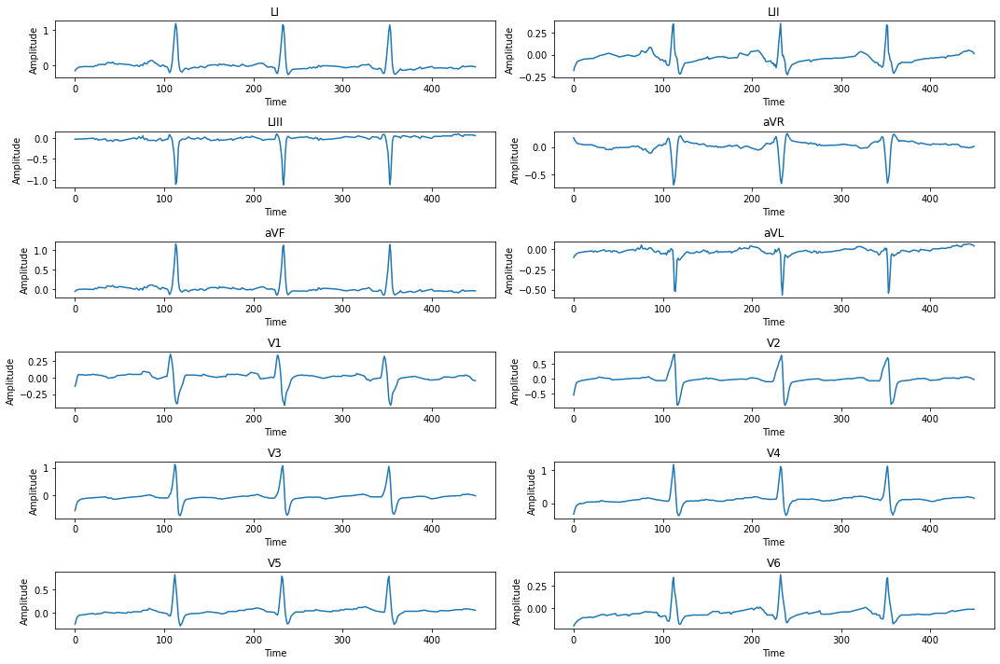

In [42]:
leads = ['LI', 'LII', 'LIII', 'aVR', 'aVF', 'aVL', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']

# Create a 6x2 subplot
fig, axes = plt.subplots(6, 2, figsize=(15, 10))

# Plot each lead in the appropriate subplot
start = np.random.randint(0,2000-451, 1)
for i in range(12):
    row, col = divmod(i, 2)  # Determine the subplot position
    axes[row, col].plot(example_signal[0, i, start[0]:(start[0]+450)])
    axes[row, col].set_title(f'{leads[i]}')
    axes[row, col].set_xlabel('Time')
    axes[row, col].set_ylabel('Amplitude')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()



In [71]:
import random

metadata = pd.read_csv('/home/david/Desktop/projects/thesis/downstream_classification/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.1/ptbxl_database.csv')
print('Repeating Readings')
display(metadata['patient_id'].value_counts().value_counts())
metadata['reading'] = [x.split('/')[-1] for x in metadata['filename_hr']]

# AF
AF_MASK = [True if 'AFIB' in metadata['scp_codes'][j] else False for j in range(len(metadata))]
metadata["AF"] = pd.Series(AF_MASK).astype(int)
# metadata = metadata[['ecg_id', 'patient_id', 'scp_codes', 'reading','AF', 'age_days']]
patients = metadata['patient_id'].unique().tolist()
print(f'There are {len(patients)} patients')

# shuffle
random.shuffle(patients)

# split
patients_train = patients[:int(0.7*len(patients))]
patients_val = patients[int(0.7*len(patients)):int(0.87*len(patients))]
patients_test = patients[int(0.87*len(patients)):]
print(f'\tPatients in Train: {len(patients_train)}')
print(f'\tPatients in Validation: {len(patients_val)}')
print(f'\tPatients in Test: {len(patients_test)}')

metadata['sample'] = None
metadata['sample'][metadata['patient_id'].isin(patients_train)] = 'train'
metadata['sample'][metadata['patient_id'].isin(patients_val)] = 'validation'
metadata['sample'][metadata['patient_id'].isin(patients_test)] = 'test'

print(f'\tObservations per sample')
display(metadata['sample'].value_counts())
display(metadata['sample'].value_counts(normalize=True))


Repeating Readings


1     16758
2      1604
3       348
4       103
5        43
6        16
7         5
8         4
9         3
10        1
Name: patient_id, dtype: int64

There are 18885 patients
	Patients in Train: 13219
	Patients in Validation: 3210
	Patients in Test: 2456
	Observations per sample


/tmp/ipykernel_11004/1764525481.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['sample'][metadata['patient_id'].isin(patients_train)] = 'train'
/tmp/ipykernel_11004/1764525481.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['sample'][metadata['patient_id'].isin(patients_val)] = 'validation'
/tmp/ipykernel_11004/1764525481.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata['sample'][metadata['pati

train         15332
validation     3706
test           2799
Name: sample, dtype: int64

train         0.702111
validation    0.169712
test          0.128177
Name: sample, dtype: float64

In [72]:
pd.crosstab(
    metadata['sample'],
    metadata['AF'],
)
pd.crosstab(
    metadata['sample'],
    metadata['AF'],
    normalize='index'
)

AF,0,1
sample,,
test,0.926760,0.073240
train,0.930537,0.069463
validation,0.934161,0.065839


In [78]:
# metadata.to_csv(f'{output_path}/metadata_with_label.csv')
metadata

,ecg_id,patient_id,age,sex,height,weight,nurse,site,device,recording_date,...,burst_noise,electrodes_problems,extra_beats,pacemaker,strat_fold,filename_lr,filename_hr,reading,AF,sample
0,1,15709.0,56.0,1,NaN,63.0,2.0,0.0,CS-12 E,1984-11-09 09:17:34,...,NaN,NaN,NaN,NaN,3,records100/00000/00001_lr,records500/00000/00001_hr,00001_hr,0,train
1,2,13243.0,19.0,0,NaN,70.0,2.0,0.0,CS-12 E,1984-11-14 12:55:37,...,NaN,NaN,NaN,NaN,2,records100/00000/00002_lr,records500/00000/00002_hr,00002_hr,0,validation
2,3,20372.0,37.0,1,NaN,69.0,2.0,0.0,CS-12 E,1984-11-15 12:49:10,...,NaN,NaN,NaN,NaN,5,records100/00000/00003_lr,records500/00000/00003_hr,00003_hr,0,test
3,4,17014.0,24.0,0,NaN,82.0,2.0,0.0,CS-12 E,1984-11-15 13:44:57,...,NaN,NaN,NaN,NaN,3,records100/00000/00004_lr,records500/00000/00004_hr,00004_hr,0,train
4,5,17448.0,19.0,1,NaN,70.0,2.0,0.0,CS-12 E,1984-11-17 10:43:15,...,NaN,NaN,NaN,NaN,4,records100/00000/00005_lr,records500/00000/00005_hr,00005_hr,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21832,21833,17180.0,67.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-05-31 09:14:35,...,NaN,NaN,1ES,NaN,7,records100/21000/21833_lr,records500/21000/21833_hr,21833_hr,0,validation
21833,21834,20703.0,93.0,0,NaN,NaN,1.0,2.0,AT-60 3,2001-06-05 11:33:39,...,NaN,NaN,NaN,NaN,4,records100/21000/21834_lr,records500/21000/21834_hr,21834_hr,0,test
21834,21835,19311.0,59.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-06-08 10:30:27,...,NaN,NaN,NaN,NaN,2,records100/21000/21835_lr,records500/21000/21835_hr,21835_hr,0,validation
21835,21836,8873.0,64.0,1,NaN,NaN,1.0,2.0,AT-60 3,2001-06-09 18:21:49,...,NaN,NaN,SVES,NaN,8,records100/21000/21836_lr,records500/21000/21836_hr,21836_hr,0,validation


# END

In [ ]:
import sys
sys.exit(0)

In [18]:
# import numpy as np
# import torch
# from sklearn.preprocessing import MinMaxScaler
# from typing import List
# import json
# import random

# import os
# data_folder = './downstream_classification/data/mit-bih/processed/'

# # import
# from downstream_classification.executors.MIT_BIH_train_on_local_machine_v2 import trainer

# from downstream_classification.dataloader.MIT_BIH_DataGenerator import MIT_BIH_DataGen
# temp = MIT_BIH_DataGen(data_path=data_folder, readings=mit_metadata['train'], batch_size=500)
# X,y = temp.__getitem__(222)

# # print('Shapes:', X.shape, y.shape)
# # print('y:', y)

ModuleNotFoundError: No module named 'dataloader'